**<h1> Google Drive Interworking </h1>**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# connect your GoogleDrive

Mounted at /content/drive
/content/drive/MyDrive


In [1]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [2]:
%pwd

'/content/drive/MyDrive'

**<h1>Installing  yolov5</h1>**
Go to the yolov5 git server and download it
The process of collectively installing the libraries required by the Requirements.txt file.

In [ ]:
# If you have already completed the installation, simply go to the appropriate path.
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [4]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 16867, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 16867 (delta 14), reused 28 (delta 4), pack-reused 16825 (from 1)
Receiving objects: 100% (16867/16867), 15.60 MiB | 16.25 MiB/s, done.
Resolving deltas: 100% (11563/11563), done.
/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 59.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.0/869.0 kB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.2 MB/s eta 0:00:00


In [ ]:
!pip install Pillow==10.3
# It's okay if there's an error, click the cancel button

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 54.5 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: pillow 10.4.0
    Uninstalling pillow-10.4.0:
      Successfully uninstalled pillow-10.4.0


**<h1>Image File Management</h1>**
Creates a folder for managing image files.

In [5]:
!mkdir -p Train/labels
!mkdir -p Train/images

Create a label folder and an image folder, and then select the yolov5 folder to insert the image into each folder.

Then put the **yolov5n.pt** file that came with the guide in the yolov5 folder and the **data.yaml** file that you modified to match the name of the class you labeled.

**<h1>Start learning the yolov5 model</h1>**

In [ ]:
# Importing required libraries
import torch
import os
from IPython.display import Image, clear_output  # to display images

In [6]:
%pwd

'/content/drive/MyDrive/yolov5'

In [ ]:
import numpy as np
import tensorflow as tf
import os
from PIL import Image
from tensorflow.python.eager.context import eager_mode

def _preproc(image, output_height=512, output_width=512, resize_side=512):
    ''' imagenet-standard: aspect-preserving resize to 256px smaller-side, then central-crop to 224px'''
    with eager_mode():
        h, w = image.shape[0], image.shape[1]
        scale = tf.cond(tf.less(h, w), lambda: resize_side / h, lambda: resize_side / w)
        resized_image = tf.compat.v1.image.resize_bilinear(tf.expand_dims(image, 0), [int(h*scale), int(w*scale)])
        cropped_image = tf.compat.v1.image.resize_with_crop_or_pad(resized_image, output_height, output_width)
        return tf.squeeze(cropped_image)

def Create_npy(imagespath, imgsize, ext) :
    images_list = [img_name for img_name in os.listdir(imagespath) if
                os.path.splitext(img_name)[1].lower() == '.'+ext.lower()]
    calib_dataset = np.zeros((len(images_list), imgsize, imgsize, 3), dtype=np.float32)

    for idx, img_name in enumerate(sorted(images_list)):
        img_path = os.path.join(imagespath, img_name)
        try:
            # Verify that the file size is normal
            if os.path.getsize(img_path) == 0:
                print(f"Error: {img_path} is empty.")
                continue

            img = Image.open(img_path)
            img = img.convert("RGB")  # Force conversion to RGB if other formats exist, such as RGBA images
            img_np = np.array(img)

            img_preproc = _preproc(img_np, imgsize, imgsize, imgsize)
            calib_dataset[idx,:,:,:] = img_preproc.numpy().astype(np.uint8)
            print(f"Processed image {img_path}")

        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    np.save('calib_set.npy', calib_dataset)



In [ ]:
# If the "cannot identify image file" error occurs, change the PILLOW Version to "!pipe install Pillow==10.1".
Create_npy('./Train/images', 512, 'jpg')

Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.


Processed image ./Train/images/test_100.jpg
Processed image ./Train/images/test_101.jpg
Processed image ./Train/images/test_102.jpg
Processed image ./Train/images/test_103.jpg
Processed image ./Train/images/test_104.jpg
Processed image ./Train/images/test_105.jpg
Processed image ./Train/images/test_106.jpg
Processed image ./Train/images/test_107.jpg
Processed image ./Train/images/test_108.jpg
Processed image ./Train/images/test_109.jpg
Processed image ./Train/images/test_110.jpg
Processed image ./Train/images/test_111.jpg
Processed image ./Train/images/test_112.jpg
Processed image ./Train/images/test_113.jpg
Processed image ./Train/images/test_114.jpg
Processed image ./Train/images/test_115.jpg
Processed image ./Train/images/test_116.jpg
Processed image ./Train/images/test_117.jpg
Processed image ./Train/images/test_118.jpg
Processed image ./Train/images/test_119.jpg
Processed image ./Train/images/test_120.jpg
Processed image ./Train/images/test_121.jpg
Processed image ./Train/images/t

In [ ]:
#To learn a model
!python train.py  --img 512 --batch 16 --epochs 300 --data /content/drive/MyDrive/yolov5/data.yaml --weights yolov5n.pt --cache

2024-08-16 07:25:31.810186: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-16 07:25:31.829637: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-16 07:25:31.835681: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5n.pt, cfg=, data=/content/drive/MyDrive/yolov5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=

**<h1>validation of yolov5 model training results</h1>**

In [12]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [14]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 512 --conf 0.1 --source /content/drive/MyDrive/yolov5/Train/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/yolov5/Train/images, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-353-g5eca7b9c Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/127 /content/drive/MyDrive/yolov5/Train/images/test_100.jpg: 384x512 18 lanes, 46.1ms
image 2/127 /content/drive/MyDrive/yolov5/Train/images/test_101.jpg: 384x512 16 lanes, 22.4ms
image 3/127 /content/drive/MyDrive/yolov5/Train/images/test_102.jpg: 384x512 

In [ ]:
# If you want to detect images and videos, check Readme, NotionReport, Verbal Explanation Video

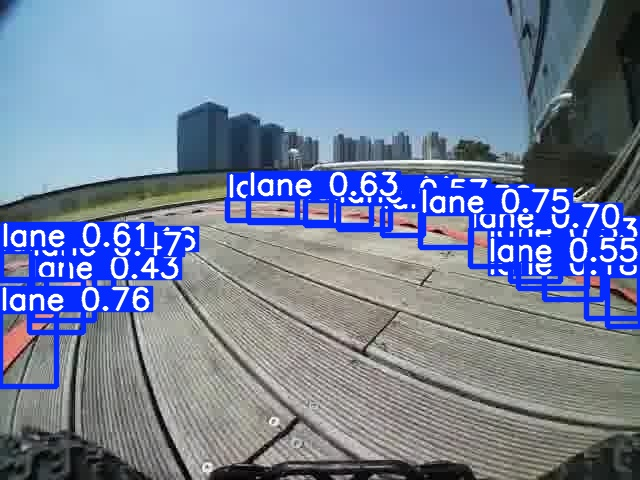

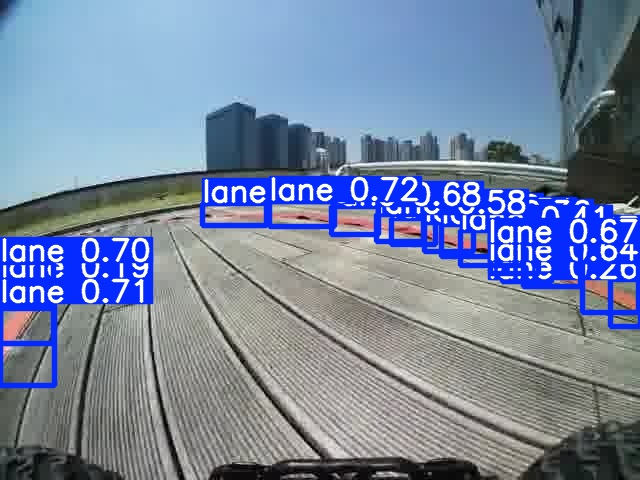

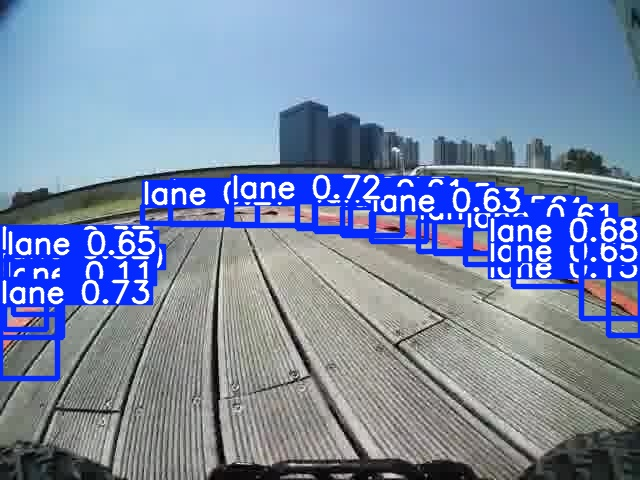

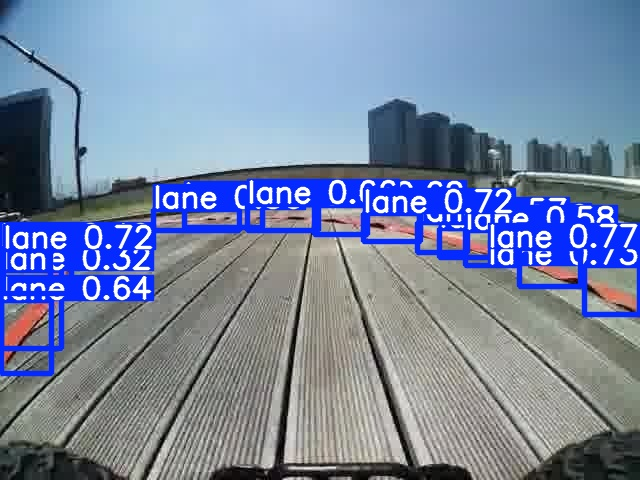

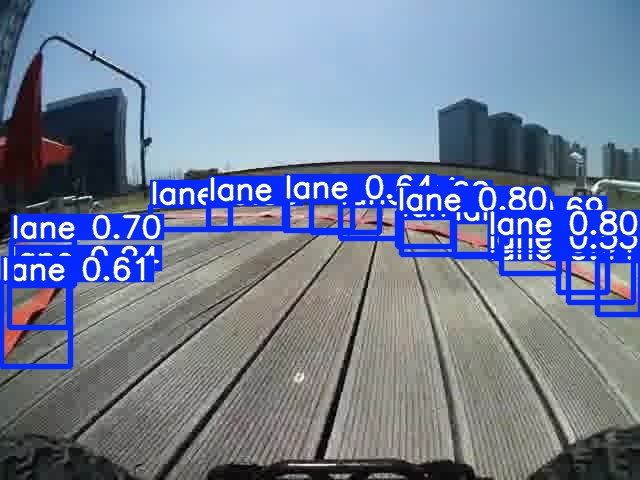

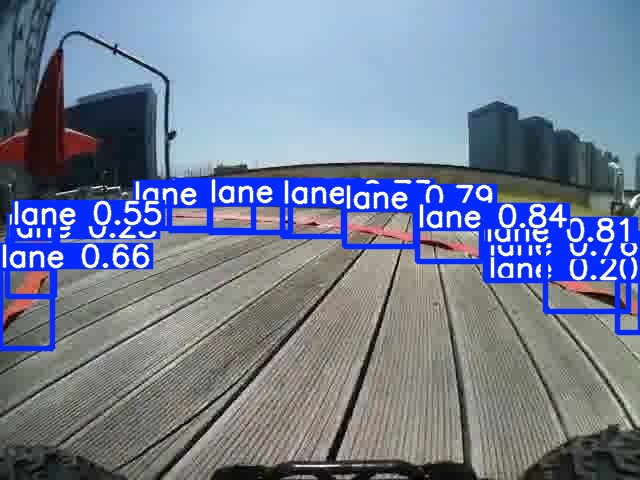

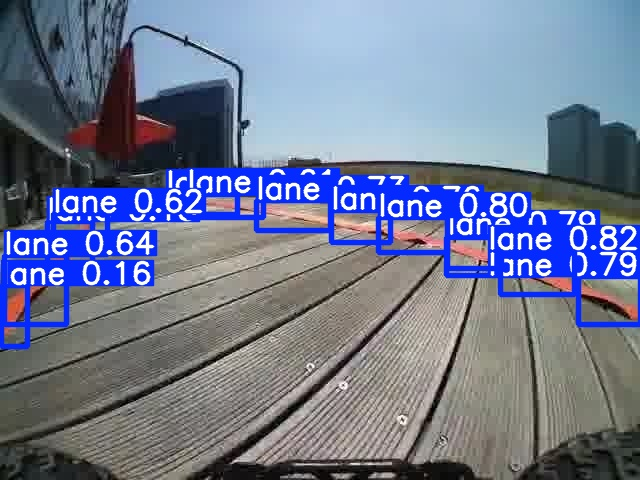

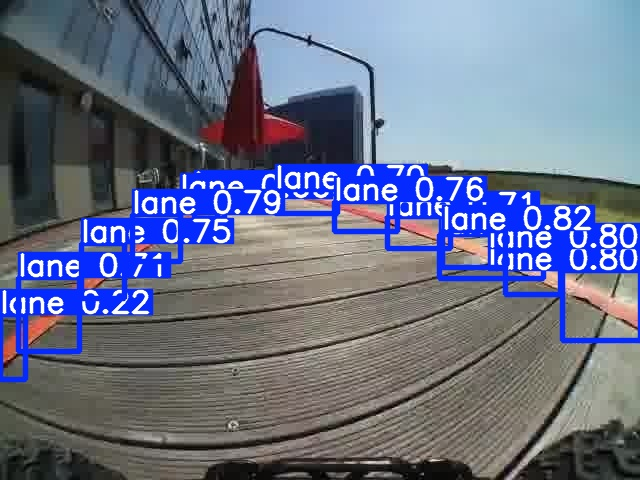

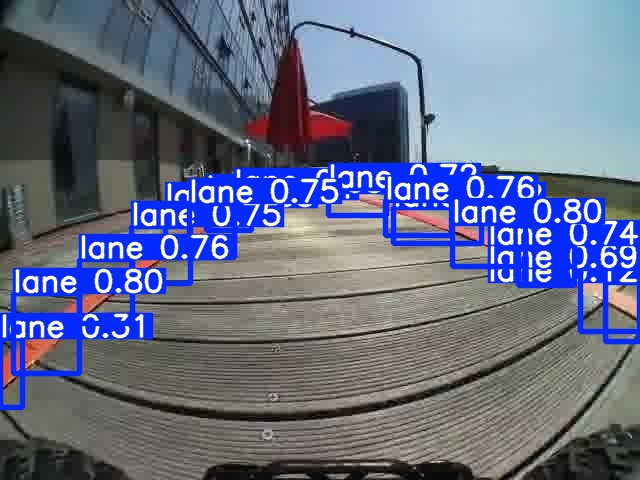

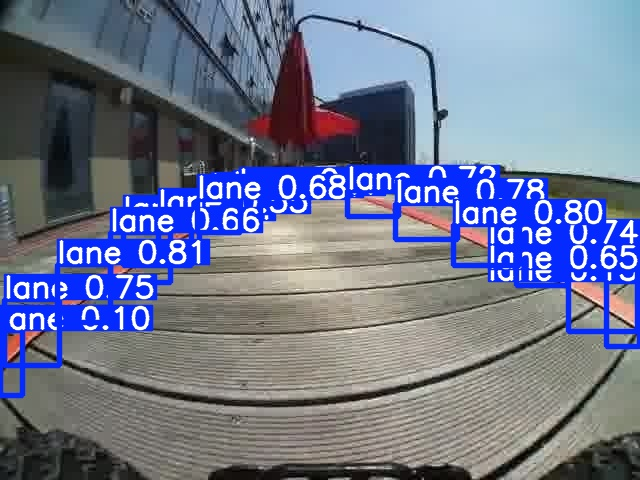

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp2/*.jpg')[:10]: #이미지 파일 형식에 맞춰 .png 또는 .jpg 등으로 수정
    display(Image(filename=imageName))
    print("\n")